In [0]:
import os
import re

import numpy as np
import tensorflow as tf

np.random.seed(1)
tf.set_random_seed(2)

import pandas as pd
import keras

from tqdm import tqdm_notebook as tqdm
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from sklearn.utils import class_weight
from sklearn.metrics import f1_score, classification_report, log_loss

from keras.preprocessing.text import Tokenizer
from keras.preprocessing.sequence import pad_sequences
from keras.utils import to_categorical

from keras.models import Sequential
from keras.layers import Embedding, LSTM, Dense, SpatialDropout1D, Bidirectional, Flatten
from keras.layers import Dropout, Conv1D, GlobalMaxPool1D, GRU, GlobalAvgPool1D
from keras.optimizers import Adam
from keras.callbacks import ModelCheckpoint, EarlyStopping

In [0]:
!pip install -U -q kaggle
!mkdir -p ~/.kaggle

In [0]:
from google.colab import files
files.upload()

In [0]:
!cp kaggle.json ~/.kaggle/

In [7]:
!kaggle datasets download -d crowdflower/first-gop-debate-twitter-sentiment
!ls

  0% 0.00/2.55M [00:00<?, ?B/s]
100% 2.55M/2.55M [00:00<00:00, 84.6MB/s]
first-gop-debate-twitter-sentiment.zip	kaggle.json  sample_data


In [8]:
!unzip first-gop-debate-twitter-sentiment.zip -d first-gop-debate-twitter-sentiment

Archive:  first-gop-debate-twitter-sentiment.zip
  inflating: first-gop-debate-twitter-sentiment/Sentiment.csv  
  inflating: first-gop-debate-twitter-sentiment/database.sqlite  


In [10]:
cd first-gop-debate-twitter-sentiment/

/content/first-gop-debate-twitter-sentiment


### Starting training

In [0]:
MAX_SEQ_LEN = 25
DEFAULT_BATCH_SIZE = 128
epochs = 25

In [12]:
data = pd.read_csv('Sentiment.csv')
data.sample(4)

,id,candidate,candidate_confidence,relevant_yn,relevant_yn_confidence,sentiment,sentiment_confidence,subject_matter,subject_matter_confidence,candidate_gold,...,relevant_yn_gold,retweet_count,sentiment_gold,subject_matter_gold,text,tweet_coord,tweet_created,tweet_id,tweet_location,user_timezone
3589,3590,No candidate mentioned,0.4456,yes,0.6675,Neutral,0.6675,None of the above,0.4456,NaN,...,NaN,0,NaN,NaN,@KatiePavlich on the show now #GOPDebate and #...,NaN,2015-08-07 09:17:10 -0700,629687737789116416,Tucson,Arizona
3660,3661,No candidate mentioned,0.4204,yes,0.6484,Neutral,0.3516,None of the above,0.2280,NaN,...,NaN,1,NaN,NaN,16% of United States homes with TV sets watche...,NaN,2015-08-07 09:16:21 -0700,629687533975109632,"Austin, Texas",Eastern Time (US & Canada)
9068,9069,No candidate mentioned,1.0000,yes,1.0000,Positive,1.0000,None of the above,1.0000,NaN,...,NaN,66,NaN,NaN,RT @DonnieWahlberg: Enjoyed the #GOPDebates an...,NaN,2015-08-06 21:02:02 -0700,629502735675580416,California,Pacific Time (US & Canada)
9153,9154,No candidate mentioned,1.0000,yes,1.0000,Negative,1.0000,FOX News or Moderators,1.0000,NaN,...,NaN,142,NaN,NaN,RT @RWSurferGirl: We the American people pick ...,NaN,2015-08-06 20:53:01 -0700,629500465131163653,NaN,NaN


In [0]:
train, test = train_test_split(data, random_state = 42, test_size=0.1)

In [0]:
def clean_text(text, mapping):
    replace_white_space = ["\n"]
    for s in replace_white_space:
        text = text.replace(s, " ")
    replace_punctuation = ["’", "‘", "´", "`", "\'", r"\'"]
    for s in replace_punctuation:
        text = text.replace(s, "'")
    mapped_string = []
    for t in text.split(" "):
        if t in mapping:
            mapped_string.append(mapping[t])
        elif t.lower() in mapping:
            mapped_string.append(mapping[t.lower()])
        else:
            mapped_string.append(t)
    return ' '.join(mapped_string)

In [0]:
CONTRACTION_MAPPING = {"don't": "do not", "haven't": "have not", "couldn't" : "could not"}
train_text_vec = [clean_text(text, CONTRACTION_MAPPING) for text in train['text'].values]
test_text_vec = [clean_text(text, CONTRACTION_MAPPING) for text in test['text'].values]

In [0]:
tokenizer = Tokenizer(lower=False)
tokenizer.fit_on_texts(train_text_vec)
train_text_vec = tokenizer.texts_to_sequences(train_text_vec)
test_text_vec = tokenizer.texts_to_sequences(test_text_vec)


In [17]:
train_text_vec = pad_sequences(train_text_vec, maxlen=MAX_SEQ_LEN)
test_text_vec = pad_sequences(test_text_vec, maxlen=MAX_SEQ_LEN)

print('Number of Tokens:', len(tokenizer.word_index))
print("Max Token Index:", train_text_vec.max(), "\n")

print('Sample Tweet Before Processing:', train["text"].values[0])
print('Sample Tweet After Processing:', tokenizer.sequences_to_texts([train_text_vec[0]]), '\n')

print('What the model will interpret:', train_text_vec[0].tolist())

Number of Tokens: 21576
Max Token Index: 21576 

Sample Tweet Before Processing: RT @kvxrdashian: when you leave the Republican Party and become a Democrat. #GOPDebate http://t.co/XrmlHwo1NV
Sample Tweet After Processing: ['RT kvxrdashian when you leave the Republican Party and become a Democrat GOPDebate http t co XrmlHwo1NV'] 

What the model will interpret: [0, 0, 0, 0, 0, 0, 0, 0, 2, 3037, 80, 22, 1040, 3, 86, 364, 12, 716, 10, 557, 1, 11, 6, 7, 8730]


In [0]:
encoder = LabelEncoder()

y_train = encoder.fit_transform(train['sentiment'].values)
y_train = to_categorical(y_train) 

y_test = encoder.fit_transform(test['sentiment'].values)
y_test = to_categorical(y_test) 

In [19]:
from collections import Counter
ctr = Counter(train['sentiment'].values)
print('Distribution of Classes:', ctr)

# get class weights for the training data, this will be used data
y_train_int = np.argmax(y_train,axis=1)
cws = class_weight.compute_class_weight('balanced', np.unique(y_train_int), y_train_int)
print(cws)

Distribution of Classes: Counter({'Negative': 7647, 'Neutral': 2834, 'Positive': 2002})
[0.54413495 1.46824277 2.07842158]


In [0]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
from sklearn.utils.multiclass import unique_labels
def plot_confusion_matrix(y_true, y_pred, classes,
                          normalize=False,
                          title=None,
                          cmap=plt.cm.Blues):
    """
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    """
    if not title:
        if normalize:
            title = 'Normalized confusion matrix'
        else:
            title = 'Confusion matrix, without normalization'

    # Compute confusion matrix
    cm = confusion_matrix(y_true, y_pred)
    # Only use the labels that appear in the data
    classes = classes[unique_labels(y_true, y_pred)]
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Normalized confusion matrix")
    else:
        print('Confusion matrix, without normalization')

    print(cm)

    fig, ax = plt.subplots()
    im = ax.imshow(cm, interpolation='nearest', cmap=cmap)
    ax.figure.colorbar(im, ax=ax)
    # We want to show all ticks...
    ax.set(xticks=np.arange(cm.shape[1]),
           yticks=np.arange(cm.shape[0]),
           # ... and label them with the respective list entries
           xticklabels=classes, yticklabels=classes,
           title=title,
           ylabel='True label',
           xlabel='Predicted label')

    # Rotate the tick labels and set their alignment.
    plt.setp(ax.get_xticklabels(), rotation=45, ha="right",
             rotation_mode="anchor")

    # Loop over data dimensions and create text annotations.
    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() / 2.
    for i in range(cm.shape[0]):
        for j in range(cm.shape[1]):
            ax.text(j, i, format(cm[i, j], fmt),
                    ha="center", va="center",
                    color="white" if cm[i, j] > thresh else "black")
    fig.tight_layout()
    return ax


In [0]:
def threshold_search(y_true, y_proba, average = None):
    best_threshold = 0
    best_score = 0
    for threshold in [i * 0.01 for i in range(100)]:
        score = f1_score(y_true=y_true, y_pred=y_proba > threshold, average=average)
        if score > best_score:
            best_threshold = threshold
            best_score = score
    search_result = {'threshold': best_threshold, 'f1': best_score}
    return search_result


def train(model, 
          X_train, y_train, X_test, y_test, 
          checkpoint_path='model.hdf5', 
          epcohs = 25, 
          batch_size = DEFAULT_BATCH_SIZE, 
          class_weights = None, 
          fit_verbose=2,
          print_summary = True
         ):
    m = model()
    if print_summary:
        print(m.summary())
    m.fit(
        X_train, 
        y_train,
        validation_data=(X_test, y_test),  
        epochs=epochs, 
        batch_size=batch_size,
        class_weight=class_weights,
         #saves the most accurate model, usually you would save the one with the lowest loss
        callbacks= [
            ModelCheckpoint(checkpoint_path, monitor='val_acc', verbose=1, save_best_only=True),
            EarlyStopping(patience = 2)
        ],
        verbose=fit_verbose
    ) 
    print("\n\n****************************\n\n")
    print('Loading Best Model...')
    m.load_weights(checkpoint_path)
    predictions = m.predict(X_test, verbose=1)
    print('Validation Loss:', log_loss(y_test, predictions))
    print('Test Accuracy', (predictions.argmax(axis = 1) == y_test.argmax(axis = 1)).mean())
    print('F1 Score:', f1_score(y_test.argmax(axis = 1), predictions.argmax(axis = 1), average='weighted'))
    plot_confusion_matrix(y_test.argmax(axis = 1), predictions.argmax(axis = 1), classes=encoder.classes_)
    plt.show()    
    return m #returns best performing model

In [0]:
def model_1c():
    """
    Adding dropout to reduce overfitting using a bidiretional LSTM with convolution
    """
    model = Sequential()
    model.add(Embedding(input_dim = (len(tokenizer.word_counts) + 1), output_dim = 128, input_length = MAX_SEQ_LEN))
    model.add(SpatialDropout1D(0.3))
    model.add(Bidirectional(LSTM(128, dropout=0.25, recurrent_dropout=0.25, return_sequences=True)))
    model.add(Conv1D(64, 4))
#     model.add(Flatten())
    model.add(GlobalMaxPool1D())
    model.add(Dense(64, activation='relu'))
    model.add(Dense(3, activation='softmax'))
    model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])
#     print(model.summary())
    return model

Instructions for updating:
Colocations handled automatically by placer.
Instructions for updating:
Please use `rate` instead of `keep_prob`. Rate should be set to `rate = 1 - keep_prob`.
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding_1 (Embedding)      (None, 25, 128)           2761856   
_________________________________________________________________
spatial_dropout1d_1 (Spatial (None, 25, 128)           0         
_________________________________________________________________
bidirectional_1 (Bidirection (None, 25, 256)           263168    
_________________________________________________________________
conv1d_1 (Conv1D)            (None, 22, 64)            65600     
_________________________________________________________________
global_max_pooling1d_1 (Glob (None, 64)                0         
_________________________________________________________________
dense_1 (Dense)      

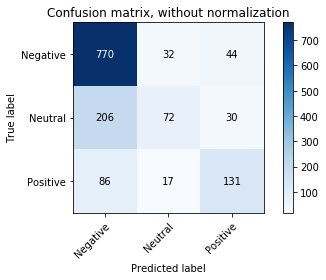

In [23]:
_ = train(model_1c, 
           train_text_vec,
           y_train,
           test_text_vec,
           y_test,
           checkpoint_path='model_1c.h5',
           class_weights=cws,
           print_summary = True
          )

In [0]:
def model_1d():
    """
    Just for fun below is a model only using covolutions. This is pretty good and also trains very quickly(and predictions would also likely be fast) compared to the LSTM...
    It's equivalent to using an n-gram based approach.
    Usually in practice you would use a more complex architecture with multiple parallel convolutions that are combined before pooling(and usually both max and avg).
    Pure Convolutional NLP is definitely a solution worth exploring further.
    """
    model = Sequential()
    model.add(Embedding(input_dim = (len(tokenizer.word_counts) + 1), output_dim = 128, input_length = MAX_SEQ_LEN))
    model.add(SpatialDropout1D(0.3))
    model.add(Conv1D(64, 5))
    model.add(Conv1D(64, 3))
    model.add(Conv1D(64, 2))
    model.add(GlobalMaxPool1D())
    model.add(Dense(64, activation='relu'))
    model.add(Dense(3, activation='softmax'))
    model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])
    return model



_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding_2 (Embedding)      (None, 25, 128)           2761856   
_________________________________________________________________
spatial_dropout1d_2 (Spatial (None, 25, 128)           0         
_________________________________________________________________
conv1d_2 (Conv1D)            (None, 21, 64)            41024     
_________________________________________________________________
conv1d_3 (Conv1D)            (None, 19, 64)            12352     
_________________________________________________________________
conv1d_4 (Conv1D)            (None, 18, 64)            8256      
_________________________________________________________________
global_max_pooling1d_2 (Glob (None, 64)                0         
_________________________________________________________________
dense_3 (Dense)              (None, 64)                4160      
__________

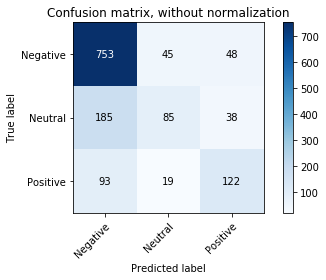

In [39]:
_ = train(model_1d, 
           train_text_vec,
           y_train,
           test_text_vec,
           y_test,
           checkpoint_path='model_1d.h5',
           class_weights=cws,
           print_summary = True
          )

## Loading our Data

In [24]:
from google.colab import files
files.upload()

Saving conflicting_comments.csv to conflicting_comments.csv


{'conflicting_comments.csv': b'index,created,comment_id,author,body,parent_id,submission_id,score,subreddit,subreddit_id,submission_group,comment_group,timestamp,linked_users,linked_subreddits,processed_body,compound_sentiment,negative_sentiment,positive_sentiment,neutral_sentiment\n0,1432869679.0,crofq47,ljrdxyh,Should win Iowa and probably wins New Hampshire....real test is South Carolina.,t1_crofp5c,37o59g,3,politics,t5_2cneq,Republican,Republican,2015-05-28 23:21:19,[],[],iowa probably win hampshire real test significant otheruth carolina,0.8176,0.0,0.429,0.571\n1,1432867687.0,croeoyz,ljrdxyh,"Well - the people have been there all along, Rand correctly states that the weapons chickenhawks provided led to the rise of the organization....no weapons, no ISIS.",t1_croe8j8,37o59g,5,politics,t5_2cneq,Republican,Republican,2015-05-28 22:48:07,[],[],well peoriginal posterle along rand correctly state weapons chicokayenhawokays provide rise organization weapons isis,-0.7096,0.249,0.065,0.68

In [25]:
!ls

conflicting_comments.csv  database.sqlite  model_1c.h5	Sentiment.csv


In [26]:
my_data = pd.read_csv('conflicting_comments.csv')
my_data.sample(5)

,index,created,comment_id,author,body,parent_id,submission_id,score,subreddit,subreddit_id,submission_group,comment_group,timestamp,linked_users,linked_subreddits,processed_body,compound_sentiment,negative_sentiment,positive_sentiment,neutral_sentiment
5030,5029,1357020199.0,c7p408q,gregdbowen,Everything.,t1_c7oullx,15pdgk,0,PoliticalDiscussion,t5_2sfmf,democrats,democrats,2013-01-01 01:03:19,[],[],everything,0.0000,0.000,0.000,1.000
9142,9141,1518385549.0,du3je0v,prohb,Had to do some PT now I'm back so let's look a...,t1_du34dqv,7wrzno,3,politics,t5_2cneq,democrats,democrats,2018-02-11 16:45:49,[],[],significant otherme backnowledge significant l...,0.5343,0.062,0.086,0.852
2555,2554,1482089383.0,dbcnqnq,MaximumEffort433,"[Did you know there have been more than 300,00...",t1_dbcn82m,5j00wh,24,politics,t5_2cneq,Republican,democrats,2016-12-18 14:29:43,[],['r/statements'],okaynow violent relate deaths since cause terr...,0.8249,0.076,0.195,0.729
11487,11485,1501966967.0,dl7rho8,greentreesbreezy,I would answer the survey honestly but I'd rat...,t1_dl7m9wp,6rtfwk,3,politics,t5_2cneq,democrats,democrats,2017-08-05 17:02:47,[],[],would answer survey honestly rather give name ...,-0.5492,0.165,0.073,0.762
14184,14182,1527468077.0,dzon04n,funknut,"While I appreciate your voluble explanation, t...",t1_dzofcwv,8mfeyf,1,politics,t5_2cneq,democrats,democrats,2018-05-27 20:41:17,[],[],appreciate voluble explanation quite ambinstag...,0.8578,0.059,0.088,0.853


In [27]:
len(my_data)

17286

In [0]:
# train_my_vec = [clean_text(text, CONTRACTION_MAPPING) for text in train['text'].values]
test_my_vec = [clean_text(text, CONTRACTION_MAPPING) for text in my_data['body'].values]

In [0]:
# tokenizer = Tokenizer(lower=False)
# tokenizer.fit_on_texts(train_text_vec)
test_my_vec = tokenizer.texts_to_sequences(test_my_vec)

In [30]:
test_my_vec = pad_sequences(test_my_vec, maxlen=MAX_SEQ_LEN)

print('Number of Tokens:', len(tokenizer.word_index))
print("Max Token Index:", test_my_vec.max(), "\n")

print('Sample Tweet Before Processing:', my_data["body"].values[0])
print('Sample Tweet After Processing:', tokenizer.sequences_to_texts([test_my_vec[0]]), '\n')

print('What the model will interpret:', test_my_vec[0].tolist())

Number of Tokens: 21576
Max Token Index: 21576 

Sample Tweet Before Processing: Should win Iowa and probably wins New Hampshire....real test is South Carolina.
Sample Tweet After Processing: ['Should win Iowa and probably wins New Hampshire real test is South Carolina'] 

What the model will interpret: [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2274, 256, 5237, 12, 841, 697, 815, 4232, 215, 2802, 9, 2937, 3990]


### Complete CNN Model

In [0]:
from keras.models import load_model
model = load_model('model_1d.h5')
result = model.predict(test_my_vec)

In [0]:
result = pd.DataFrame(result, columns = ['Negative', 'Neutral', 'Positive'])
my_text = my_data.iloc[:,:-4]
dt = my_text.merge(result, left_index=True, right_index=True)

In [43]:
dt

,index,created,comment_id,author,body,parent_id,submission_id,score,subreddit,subreddit_id,submission_group,comment_group,timestamp,linked_users,linked_subreddits,processed_body,Negative,Neutral,Positive
0,0,1432869679.0,crofq47,ljrdxyh,Should win Iowa and probably wins New Hampshir...,t1_crofp5c,37o59g,3,politics,t5_2cneq,Republican,Republican,2015-05-28 23:21:19,[],[],iowa probably win hampshire real test signific...,0.274794,0.158219,0.566987
1,1,1432867687.0,croeoyz,ljrdxyh,"Well - the people have been there all along, R...",t1_croe8j8,37o59g,5,politics,t5_2cneq,Republican,Republican,2015-05-28 22:48:07,[],[],well peoriginal posterle along rand correctly ...,0.868357,0.082497,0.049147
2,2,1432867596.0,croen90,ljrdxyh,His record? How so?,t1_croeh7y,37o59g,7,politics,t5_2cneq,Republican,Republican,2015-05-28 22:46:36,[],[],record significant,0.332258,0.429808,0.237934
3,3,1432869615.0,crofoyq,ljrdxyh,Agree that it is their responsibility.....whic...,t1_crofneg,37o59g,2,politics,t5_2cneq,Republican,Republican,2015-05-28 23:20:15,[],[],agree reddit enhancement suiteponsibilithank g...,0.571190,0.247362,0.181448
4,4,1432869408.0,crofl4c,ljrdxyh,"From one of the comments on the link: ""left p...",t1_crof082,37o59g,23,politics,t5_2cneq,Republican,Republican,2015-05-28 23:16:48,[],[],comment linokay leave plenthank looriginal pos...,0.589816,0.235213,0.174971
5,5,1420345376.0,cndsu36,ljrdxyh,Kinds of guessed it would....but i tried....,t1_cndsm26,2r9ohg,1,politics,t5_2cneq,Republican,Republican,2015-01-03 23:22:56,[],[],okayinds guess would try,0.358555,0.199261,0.442184
6,6,1419927453.0,cn963kg,ljrdxyh,Ha!\n\nLet me educate you.......libertarians a...,t1_cn95w7m,2qsny9,-3,politics,t5_2cneq,Republican,Republican,2014-12-30 03:17:33,[],[],educate libertarians rinstagramht paul educati...,0.762800,0.095797,0.141402
7,7,1399608372.0,chddpsr,ljrdxyh,You have to fact-check fact-check.....from the...,t1_chdd1zq,253lae,3,politics,t5_2cneq,Republican,Republican,2014-05-09 00:06:12,[],[],fact checokay fact checokay horse mouth https ...,0.617054,0.357552,0.025393
8,8,1395940148.0,cgdduac,ljrdxyh,"Nah, maybe no clap for the current regime.",t1_cgdcaof,21gimq,1,politics,t5_2cneq,Republican,Republican,2014-03-27 13:09:08,[],[],maybe clap yourrent reginstant messagee,0.757080,0.226315,0.016605
9,9,1395946409.0,cgdh3lu,ljrdxyh,Amen.,t1_cgdehnx,21gimq,1,politics,t5_2cneq,Republican,Republican,2014-03-27 14:53:29,[],[],amen,0.330361,0.574263,0.095376


In [0]:
dt.to_csv('CNN_conflicting_comment.csv')
from google.colab import files
files.download('CNN_conflicting_comment.csv')

### LSTM + CNN model

In [0]:
from keras.models import load_model
model_lstm = load_model('model_1c.h5')
result_lstm = model_lstm.predict(test_my_vec)

In [35]:
result_lstm = pd.DataFrame(result_lstm, columns = ['Negative', 'Neutral', 'Positive'])
my_text = my_data.iloc[:,:-4]
dt2 = my_text.merge(result_lstm, left_index=True, right_index=True)
dt2.sample(6)

,index,created,comment_id,author,body,parent_id,submission_id,score,subreddit,subreddit_id,submission_group,comment_group,timestamp,linked_users,linked_subreddits,processed_body,Negative,Neutral,Positive
646,646,1544653815.0,ebnt35y,Dillionmesh,What a productive answer to my question. I tot...,t1_ebnsyrb,a5lmb1,1,politics,t5_2cneq,Republican,Republican,2018-12-12 17:30:15,[],[],productive answer question totally understand ...,0.560221,0.378565,0.061214
1511,1511,1472112190.0,d6vttju,Archer-Saurus,"I agree, they do really great work out there.",t1_d6vto8p,4zglqd,2,PoliticalDiscussion,t5_2sfmf,Republican,Republican,2016-08-25 04:03:10,[],[],agree really great worokay,0.431504,0.190797,0.377699
12879,12877,1540735035.0,e8lotop,UWCG,"> ""To the victims' families, to the victims' f...",t3_9s39xg,9s39xg,7,politics,t5_2cneq,democrats,democrats,2018-10-28 09:57:15,[],[],victinstant message families victinstant messa...,0.709812,0.230168,0.060020
13279,13277,1519087193.0,duio56q,swanspank,"Overturned based on what, Hillary's SCOTUS app...",t1_duhob5s,7yf730,1,politics,t5_2cneq,democrats,Republican,2018-02-19 19:39:53,[],[],overturn base hillary scotus appointments rins...,0.919398,0.055911,0.024690
13971,13969,1276104650.0,c0rqxom,wsppan,"If not for the government, B.P. would have no ...",t1_c0rqt7o,cd6tc,5,politics,t5_2cneq,democrats,democrats,2010-06-09 13:30:50,[],[],governothing muchent would reasignificant othe...,0.934950,0.050986,0.014064
6080,6079,1469190056.0,d5m8lxl,njmaverick,Nothing says denounce like doing so on Prime T...,t1_d5loafn,4tx9rg,0,politics,t5_2cneq,democrats,democrats,2016-07-22 08:20:56,[],[],nothing say denounce liokaye significant prins...,0.704626,0.196095,0.099278


In [0]:
dt2.to_csv("LSTM_conflicting_comments.csv")
from google.colab import files
files.download('LSTM_conflicting_comments.csv')